Exploratory Data Analysis of a PDF format eBook 
=====
(Ficciones, written by Jorge Luis Borges)
-----------

### Table of contents


- [Libraries](#0.-Libraries)
- [Data Source and Data Extraction](#1.-Data-Source-and-Data-Extraction)
    - [Data Source](#1.1.-Data-source)
    - [Data Extraction](#1.2.-Data-extraction)
- [Data Cleaning](#2.-Data-cleaning)
- [Data Analysis](#3.-Data-analysis)
    - [Words per page](#3.1.-Words-per-page)
        - [Data information](#3.1.1.-Data-information)
        - [Dispersion and outliers](#3.1.2.-Dispertion-and-outliers)
        - [Descriptive statistics](#3.1.3.-Descriptive-statistics)
        - [Frequency of words](#3.1.4.-Frequency-of-words)
    - [Words per chapter](#3.2.-Words-per-chapter)
        - [Data preparation](#3.2.1.-Data-preparation)
        - [Data information](#3.2.2.-Data-information)
        - [Dispersion and outliers](#3.2.3.-Dispersion-and-outliers)
        - [Count of words](#3.2.4.-Count-of-words)
        - [Descriptive statistics](#3.2.5.-Descriptive-statistics)
        - [Frequency of words](#3.2.6.-Frequency-of-words)
    - [Pages per chapter](#3.3.-Pages-per-chapter)
        - [Data preparation](#3.3.1.-Data-preparation)
        - [Descriptive statistics](#3.3.2.-Descriptive-statistics)
        - [Count of pages](#3.3.3.-Count-of-pages)
        - [Proportion of chapters](#3.3.4.-Proportion-of-chapters)
        - [Statistic analysis - linear regression](#3.3.5.-Statistic-analysis:-Linear-regression)
    - [Pages per section](#3.4.-Pages-per-section)
        - [Data preparation](#3.4.1-Data-preparation)
        - [Proportion of sections](#3.4.2.-Proportion-of-sections)
    - [Total words](#3.5.-Total-words)
        - [Data preparation](#3.5.1.-Data-preparation)
        - [Descriptive statistics](#3.5.2.-Descriptive-statistics)
        - [Frequency of words](3.5.3.-Frequency-of-words)
- [Further Analysis and Processing](#4.-Further-analysis-and-processing)
    - [Case: Seek for words](#4.1.-Case:-Seek-for-words)
        - [Seach and locate a specific word](#4.1.1.-Seach-and-locate-a-specific-word)
        - [Get sentences for a specific word](#4.1.2.-Get-sentences-for-a-specific-word)
    - [Case: Compare multiple data against API requests](#4.2.-Case:-Compare-multiple-data-against-API-requests)
        - [Search if the 500 words most used are in the RAE](#4.2.1.-Search-if-the-500-words-most-used-are-in-the-RAE)
    - [Case: Applications of probability and statistics](#4.3.-Case:-Applications-of-probability-and-statistics)
        - [Estimation of chapters length](#4.3.1.-Estimation-of-chapters-length)
        - [Poisson distribution of probability of chapters length](#4.3.2.-Poisson-distribution-of-probability-of-chapters-length)
    - [Case: Wordcloud plot](#4.4.-Case:-Wordcloud-plot)

## 0. Libraries

In [199]:
from urllib.request import Request, urlopen
import io
from PyPDF2 import PdfWriter, PdfReader
import re
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns


from pyrae import dle
from scipy.stats import poisson, linregress
import plotly.express as px
from wordcloud import WordCloud

## 1. Data Source and Data Extraction

### 1.1. Data source

In [2]:
url = 'https://ddooss.org/libros/Jorge_Luis_Borges_ficciones.pdf'
req = Request(url)
remote_pdf = urlopen(req).read()
memory_pdf = io.BytesIO(remote_pdf)
pdf = PdfReader(memory_pdf)

### 1.2. Data extraction

In [4]:
# function 01 - extract words from pdf file in a nested list
def extract_words(pdf_file):
    words_per_page = []
    for page in range(len(pdf_file.pages)):
        pdf_page = pdf_file.pages[page].extract_text()
        regex_words = re.findall(r'[^\s\W]+', pdf_page)
        list_words = []
        for word in regex_words:
            if not (word.islower()):
                list_words.append(word.replace(word, word.lower()))
            else:
                list_words.append(word)
        words_per_page.append(list_words)
    return words_per_page

In [5]:
# Extract words (use function 01)
words_per_page = extract_words(pdf)

In [6]:
# Create a DataFrame from the nested list
data = pd.DataFrame(words_per_page)

# It is expected to have a page as a column, thus a transposition is necessary
data = data.T

## 2. Data cleaning

#### Check the DataFrame

In [7]:
# Take a look at the first 5 rows
data.head()

,0,1,2,3,4,5,6,7,8,9,...,76,77,78,79,80,81,82,83,84,85
0,jorge,prólogo,hasta,a,eell,ficciones,ficciones,ficciones,ficciones,ficciones,...,ficciones,ficciones,ficciones,ficciones,ficciones,ficciones,ficciones,ficciones,ficciones,prólogo
1,luis,josé,la,esther,jjaarrddíínn,jorge,jorge,jorge,jorge,jorge,...,jorge,jorge,jorge,jorge,jorge,jorge,jorge,jorge,jorge,2
2,borges,luis,más,zemborain,ddee,luis,luis,luis,luis,luis,...,luis,luis,luis,luis,luis,luis,luis,luis,luis,el
3,ficciones,rodríguez,lúcida,de,sseennddeerrooss,borges,borges,borges,borges,borges,...,borges,borges,borges,borges,borges,borges,borges,borges,borges,jardín
4,hijo,zapatero,locura,torres,qquuee,6,7,8,9,10,...,77,78,79,80,81,82,83,84,85,de


In [8]:
# Take a look at the last 5 rows
data.tail()

,0,1,2,3,4,5,6,7,8,9,...,76,77,78,79,80,81,82,83,84,85
741,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
742,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
743,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
744,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
745,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None


In [9]:
# Check the number of rows and columns
print('Number of columns:', len(data.columns))
print('Number of rows:', len(data))

Number of columns: 86
Number of rows: 746


In [10]:
# Take a look at the data types - all columns are objects, since all are strings
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 746 entries, 0 to 745
Data columns (total 86 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       276 non-null    object
 1   1       529 non-null    object
 2   2       151 non-null    object
 3   3       5 non-null      object
 4   4       8 non-null      object
 5   5       329 non-null    object
 6   6       524 non-null    object
 7   7       614 non-null    object
 8   8       729 non-null    object
 9   9       673 non-null    object
 10  10      631 non-null    object
 11  11      665 non-null    object
 12  12      629 non-null    object
 13  13      703 non-null    object
 14  14      586 non-null    object
 15  15      549 non-null    object
 16  16      743 non-null    object
 17  17      644 non-null    object
 18  18      361 non-null    object
 19  19      436 non-null    object
 20  20      543 non-null    object
 21  21      631 non-null    object
 22  22      634 non-null    ob

In [11]:
# Since the pdf file contains pages not written by the author, these are discarted
data = data.loc[:, 4:84]

**Add names to the columns**

In [13]:
# Since the majority of the number of pages are in the row 4, this row is used as a guide

# Select the row
col_names_1 = data[data[5]=='6']
# Transpose the row to a column - the column is the 4
col_names_2 = col_names_1.T
# Pass the column to a list - to refer to the column, we need the 4
col_names_3 = col_names_2[4].tolist()
# Pass the list as column names
data.columns = col_names_3

In [14]:
# If we check at the column names, most of the columns has the name according to the number of page, but the first one
data.columns

Index(['qquuee', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16',
       '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28',
       '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40',
       '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52',
       '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64',
       '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76',
       '77', '78', '79', '80', '81', '82', '83', '84', '85'],
      dtype='object')

In [15]:
# The only one that is not correct is the first - change manually
data.rename(columns = {'qquuee':'5'}, inplace=True)

In [16]:
# Check again to see if the changes were applied
data.columns

Index(['5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17',
       '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29',
       '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41',
       '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53',
       '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65',
       '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77',
       '78', '79', '80', '81', '82', '83', '84', '85'],
      dtype='object')

#### Remove data not necessary: the author name, book title and page number

In [18]:
# the book title is at the first row (row[0])
# the author name is between the rows 1 - 3
# the number of page is at row[4]
data[0:4].T.value_counts()

0          1             2     3               
ficciones  jorge         luis  borges              80
eell       jjaarrddíínn  ddee  sseennddeerrooss     1
dtype: int64

In [19]:
# the data of almost each page begins at the row 5, so the rest previous rows are discarted
data = data.loc[5:, :]

In [20]:
# it has to be mentioned that the this short stories book is dividedd in two sections
# on the pages of these section titles lie a few words corresponfing to the name of the sections
data.notnull().sum().sort_values(ascending=True)


59      1
49      2
5       3
77     35
37     49
     ... 
9     724
75    726
44    728
17    738
28    741
Length: 81, dtype: int64

In [21]:
# the pages corresponding to the these values are the page 5 and 49
# Note that even if the page 59 has only one word, this is part of a short-story
# these pages will be removed


In [22]:
# drop columns 5 and 49
data = data.drop(['5', '49'], axis=1)

In [23]:
# check is these columns appear - they are removed
data.notnull().sum().sort_values(ascending=True)

59      1
77     35
37     49
29     58
55     87
     ... 
9     724
75    726
44    728
17    738
28    741
Length: 79, dtype: int64

And now the data is ready for the analysis

## 3. Data Analysis

### 3.1. Words per page

### *3.1.1. Data information*

In [25]:
# for a better description the dataframe 'data' will be passed to another 'words'
words = data

In [26]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 741 entries, 5 to 745
Data columns (total 79 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   6       324 non-null    object
 1   7       519 non-null    object
 2   8       609 non-null    object
 3   9       724 non-null    object
 4   10      668 non-null    object
 5   11      626 non-null    object
 6   12      660 non-null    object
 7   13      624 non-null    object
 8   14      698 non-null    object
 9   15      581 non-null    object
 10  16      544 non-null    object
 11  17      738 non-null    object
 12  18      639 non-null    object
 13  19      356 non-null    object
 14  20      431 non-null    object
 15  21      538 non-null    object
 16  22      626 non-null    object
 17  23      629 non-null    object
 18  24      515 non-null    object
 19  25      135 non-null    object
 20  26      534 non-null    object
 21  27      700 non-null    object
 22  28      741 non-null    ob

[Text(0.5, 23.52222222222222, 'Page'), Text(50.722222222222214, 0.5, 'Words')]

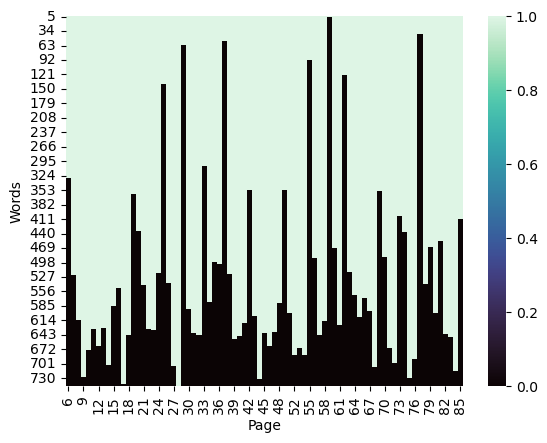

In [27]:
# A preview of the data - graphical approach
words_per_page_heatmap_sns =  sns.heatmap(words.notnull(),
                                          cmap="mako")
words_per_page_heatmap_sns.set(xlabel="Page", ylabel="Words")

In [28]:
px_heatmap_words = px.imshow(words.notnull(),
                         aspect="auto",
                         zmin=0,
                         zmax=1,
                         color_continuous_scale = px.colors.sequential.Teal,
                         labels = dict(x="Page", y="Words"))
px_heatmap_words.show()
px_heatmap_words.write_html("01_words_per_page_heatmap.html")

### *3.1.2. Dispertion and outliers*

In [37]:
# function 02 - get quantiles 
def get_quantile(data, q):
    interpolation_val_x = len(data)*q + 0.5 - 1
    if interpolation_val_x.is_integer():
        return (sorted(data)[int(interpolation_val_x)])
    else:
        return (np.interp(interpolation_val_x, [x for x in range(len(data))], sorted(data)))
    

In [38]:
# Get quantiles 1 and 3, as well as the maximum and minimum limits
q1 = get_quantile(words.notnull().sum(), 0.25)
q3 = get_quantile(words.notnull().sum(), 0.75)
median = words.notnull().sum().median()
iqr = q3-q1
min_lim = q1-(iqr*1.5)
max_lim = q3+(iqr*1.5)

words_with_outliers_data = [q1, q3, median, iqr, min_lim, max_lim]

print('q1: ', q1)
print('q3: ', q3)
print('median: ', median)
print('min lim: ', min_lim)
print('max lim: ', max_lim)

q1:  469.25
q3:  642.25
median:  594.0
min lim:  209.75
max lim:  901.75


[Text(0, 0.5, 'Words')]

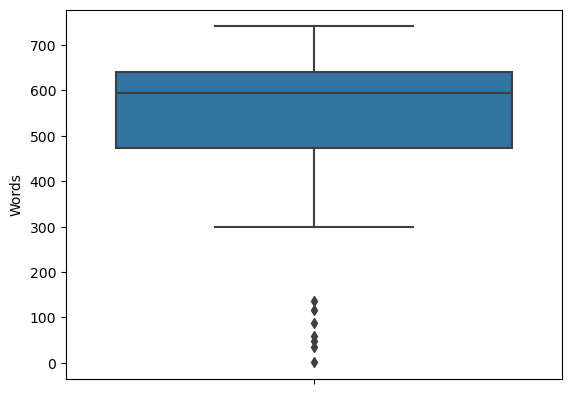

In [39]:
sns_boxplot_words = sns.boxplot(y=words.notnull().sum())
sns_boxplot_words.set(ylabel="Words")

In [69]:
# Plot with Plotly
px_boxplot_words = px.box(y=words.notnull().sum(),
                          labels = dict(y="Words"),
                          color_discrete_sequence=px.colors.sequential.Tealgrn[::-1])
px_boxplot_words.show()
px_boxplot_words.write_html("02_words_per_page_boxplot.html")

In [41]:
## Since we have outliers - we will remove them
max_outliers = []
min_outliers = []

for col in words.columns.tolist():
    if (words[col].notnull().sum() < min_lim):
        min_outliers.append(col)
    elif (words[col].notnull().sum() > max_lim):
        max_outliers.append(col)
        
print("Outliers above the max limit: ", max_outliers)
print("Outliers below the min limit: ", min_outliers)

Outliers above the max limit:  []
Outliers below the min limit:  ['25', '29', '37', '55', '59', '62', '77']


In [42]:
## Case: If the outliers were removed from the dataframe
words_without_outliers = words.drop(min_outliers, axis=1) 
words_without_outliers.columns

Index(['6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17',
       '18', '19', '20', '21', '22', '23', '24', '26', '27', '28', '30', '31',
       '32', '33', '34', '35', '36', '38', '39', '40', '41', '42', '43', '44',
       '45', '46', '47', '48', '50', '51', '52', '53', '54', '56', '57', '58',
       '60', '61', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72',
       '73', '74', '75', '76', '78', '79', '80', '81', '82', '83', '84', '85'],
      dtype='object')

In [43]:
### Repeat the qunatile partition for the words without outliers
# Get quantiles 1 and 3, as well as the maximum and minimum limits
q1 = get_quantile(words_without_outliers.notnull().sum(), 0.25)
q3 = get_quantile(words_without_outliers.notnull().sum(), 0.75)
median = words_without_outliers.notnull().sum().median()
iqr = q3-q1
min_lim = q1-(iqr*1.5)
max_lim = q3+(iqr*1.5)

words_without_outliers_data = [q1, q3, median, iqr, min_lim, max_lim]

print('q1: ', q1)
print('q3: ', q3)
print('median: ', median)
print('min lim: ', min_lim)
print('max lim: ', max_lim)

q1:  514.0
q3:  653.5
median:  606.0
min lim:  304.75
max lim:  862.75


[Text(0, 0.5, 'Words')]

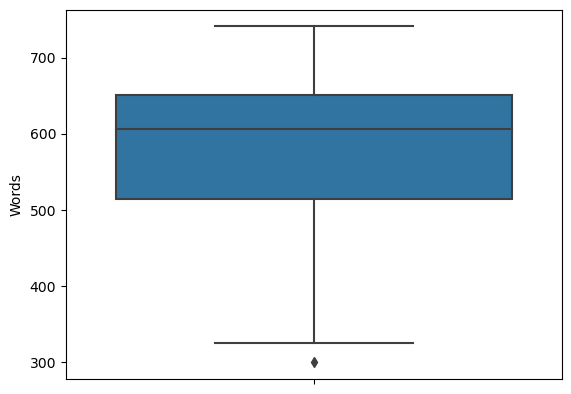

In [44]:
# Graphical approach - Seaborn
sns_boxplot_words = sns.boxplot(y=words_without_outliers.notnull().sum())
sns_boxplot_words.set(ylabel="Words")

In [70]:
# Graphical approach - Plotly
px_boxplot_words_no_ols = px.box(y=words_without_outliers.notnull().sum(),
                          labels = dict(y="Words"),
                          color_discrete_sequence=px.colors.sequential.Tealgrn[::-1])
px_boxplot_words_no_ols.show()
px_boxplot_words_no_ols.write_html("03_words_per_page_no_ol_boxplot.html")

In [46]:
# It is noticeable the change

# For more clarity a comparison is made
outliers_discard = pd.DataFrame([words_with_outliers_data, words_without_outliers_data])
# Put names to the dataframe
outliers_discard.columns=['Q1', 'Q3', 'Median', 'IQR', 'Min_Lim', 'Max_Lim']
# Transpose to ease the comparison
outliers_discard = outliers_discard.T
# Put names to the transposed dataframe
outliers_discard.columns=['With_outliers', 'Without_outliers']


In [47]:
outliers_discard

,With_outliers,Without_outliers
Q1,469.25,514.00
Q3,642.25,653.50
Median,594.00,606.00
IQR,173.00,139.50
Min_Lim,209.75,304.75
Max_Lim,901.75,862.75


A new iteration of the outliers removal can be done.
However, considering the limited amount of data, the data with outliers will be used for further analysis


### *3.1.3. Descriptive statistics*

In [29]:
# Check the page with least words
print("Page with the least amount of words:", words.notnull().sum().sort_values(ascending=True).index[0])
print("Words in this page:", words.notnull().sum().sort_values(ascending=True)[0])

Page with the least amount of words: 59
Words in this page: 1


In [30]:
# Check the page with most words
print("Page with most number of words:", words.notnull().sum().sort_values(ascending=False).index[0])
print("Words in this page:", words.notnull().sum().sort_values(ascending=False)[0])

Page with most number of words: 28
Words in this page: 741


In [31]:
# Mean value for words per page
print("On average, a page has", round(words.notnull().sum().mean()), "words")

On average, a page has 532 words


In [32]:
# Standard deviation
print(round(words.notnull().sum().std()))

180


In [33]:
# Coefficient of deviation
cv = round(words.notnull().sum().std() / words.notnull().sum().mean(), 4)
print("The coefficient of deviation is", cv, " or ", cv*100, "%")

The coefficient of deviation is 0.3382  or  33.82 %


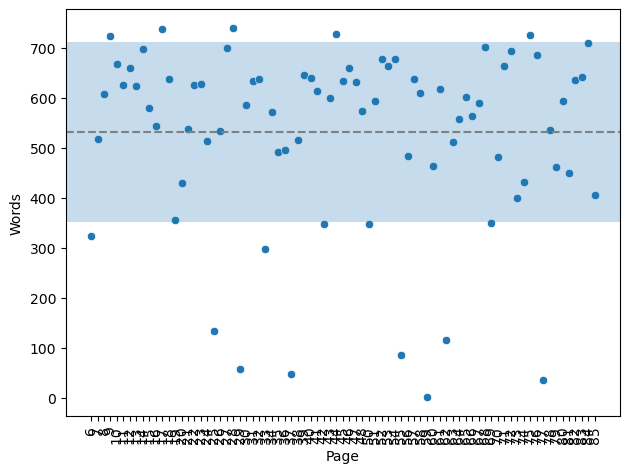

In [35]:
# A graphical approach with 

sns_scatter_words = sns.scatterplot(x=words.notnull().sum().index,
                                    y=words.notnull().sum())
# Mean line
mean = words.notnull().sum().mean()
sns_scatter_words.axhline(y=mean,
                color='gray',
                linestyle='--')

# Standard deviation
std = words.notnull().sum().std()
sns_scatter_words.axhspan(ymin=mean-std,
                ymax=mean+std,
                alpha=0.25)
sns_scatter_words.set(xlabel="Page", ylabel="Words")
# Compile
plt.tight_layout()
plt.xticks(rotation=90)
plt.show()

In [36]:
px_scatter_words = px.scatter(x=words.notnull().sum().index,
                              y=words.notnull().sum(),
                              color_discrete_sequence=px.colors.sequential.Teal[::-1],
                              labels=dict(x="Page", y="Words"))

px_scatter_words.add_shape(type="line",
                           x0=len(words.columns)-len(words.columns),
                           y0=words.notnull().sum().mean(),
                           x1=len(words.columns)-1,
                           y1=words.notnull().sum().mean(),
                           line=dict(
                               color="MediumPurple",
                               width=2,
                               dash="dash")
                           )

px_scatter_words.add_shape(type="rect",
                           x0=len(words.columns)-len(words.columns),
                           y0=words.notnull().sum().mean()-words.notnull().sum().std(),
                           x1=len(words.columns)-1,
                           y1=words.notnull().sum().mean()+words.notnull().sum().std(),
                           fillcolor="Teal",
                           opacity=0.2,
                           layer="below",
                           line_width=0)

px_scatter_words.show()
px_scatter_words.write_html("04_words_per_page_scatter.html")

### *3.1.4. Frequency of words*

In [49]:
# Create a new data frame including: 
#   the page number, 
#   the most used word in the page and 
#   the times the word is used


# Get these as lists
page_list = []
word_list = []
word_times_list = []
for col in words.columns.tolist():
    page_list.append(col)
    word_list.append(words[col].value_counts().index[0])
    word_times_list.append(words[col].value_counts()[0])

In [50]:
# Make a tuple of the lists
most_used_words_tuple = list(zip(page_list, word_list, word_times_list))

# Create a dataframe from the tuple
most_used_words = pd.DataFrame(most_used_words_tuple, columns=['Page', 'Word', 'Times'])


In [51]:
# Which was the most used word?
print("The most used of for the majority of pages was '", most_used_words['Word'].value_counts().index[0], "'")
print("the word was the most used in", most_used_words['Word'].value_counts()[0],"pages")


The most used of for the majority of pages was ' de '
the word was the most used in 68 pages


[Text(0.5, 0, 'Count'), Text(0, 0.5, 'Word')]

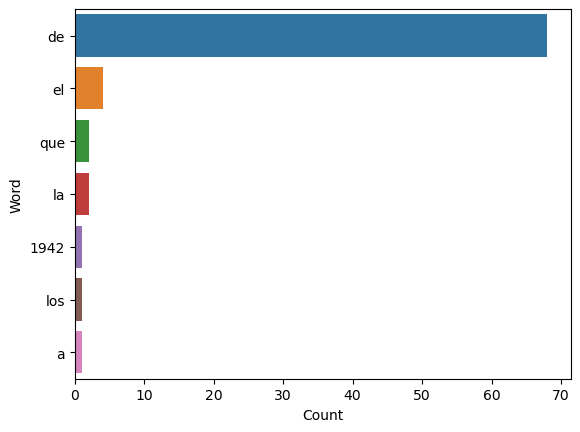

In [52]:
# Graphical approach - Seaborn

sns_bar_used_words = sns.barplot(y=most_used_words['Word'].value_counts().index.tolist(),
                                 x=most_used_words['Word'].value_counts().tolist())
sns_bar_used_words.set(xlabel="Count", ylabel="Word")


In [72]:
# Graph - Plotly

px_bar_used_words = px.bar(y=most_used_words['Word'].value_counts().index.tolist(),
                           x=most_used_words['Word'].value_counts().tolist(),
                           labels=dict(x='Count', y='Word'))
px_bar_used_words.show()
px_bar_used_words.write_html("05_words_most_used_bar.html")


### 3.2. Words per chapter

#### Index of the book

EL JARDÍN DE SENDEROS QUE SE BIFURCAN  5
- Prólogo  6
- Tlön, Uqbar, Orbis Tertius  7
- El acercamiento a Almotásim  16
- Pierre Menard, autor del Quijote  20
- Las ruinas circulares  26
- La lotería en Babilonia  30
- Examen de la obra de Herbert Quain  34
- La Biblioteca de Babel  38
- El jardín de los senderos que se bifurcan  43

ARTIFICIOS  49
- Prólogo  50
- Funes el memorioso  51
- La forma de la espada  56
- Tema del traidor y del héroe  60
- La muerte y la brújula  63
- El milagro secreto  70
- Tres versiones de Judas  74
- El fin  78
- La secta del Fénix  80
- El Sur  82

### *3.2.1. Data preparation*

In [56]:
# functio 03 - Pages separator
def pages_separator(first_page, last_page):
    pages_list = words.loc[:, first_page: last_page].columns.tolist()
    output_separation = []
    for page in pages_list:
        output_separation.extend(words[page])
    return output_separation

In [57]:
# Extract chapter for part I
chapter_1 = pages_separator('7', '15')
chapter_2 = pages_separator('16', '19')
chapter_3 = pages_separator('20', '25')
chapter_4 = pages_separator('26', '29')
chapter_5 = pages_separator('30', '33')
chapter_6 = pages_separator('34', '37')
chapter_7 = pages_separator('38', '42')
chapter_8 = pages_separator('43', '48')
# Extract chapter for part II
chapter_9 = pages_separator('51', '55')
chapter_10 = pages_separator('56', '59')
chapter_11 = pages_separator('60', '62')
chapter_12 = pages_separator('63', '69')
chapter_13 = pages_separator('70', '73')
chapter_14 = pages_separator('74', '77')
chapter_15 = pages_separator('78', '79')
chapter_16 = pages_separator('80', '81')
chapter_17 = pages_separator('82', '85')

In [58]:
# Put into a nested list form chapter
chapter_dict = []

# Append chapters from section I
chapter_dict.append(chapter_1)
chapter_dict.append(chapter_2)
chapter_dict.append(chapter_3)
chapter_dict.append(chapter_4)
chapter_dict.append(chapter_5)
chapter_dict.append(chapter_6)
chapter_dict.append(chapter_7)
chapter_dict.append(chapter_8)

# Append chapters from section II
chapter_dict.append(chapter_9)
chapter_dict.append(chapter_10)
chapter_dict.append(chapter_11)
chapter_dict.append(chapter_12)
chapter_dict.append(chapter_13)
chapter_dict.append(chapter_14)
chapter_dict.append(chapter_15)
chapter_dict.append(chapter_16)
chapter_dict.append(chapter_17)

In [59]:
# Create a dataframe for the chapters
chapters = pd.DataFrame(chapter_dict).T

In [60]:
# Quick loop to get number of chapters
def get_chapter_numbers():
    i = 1
    cols = []
    while i <= 17:
        cols.append(str(i))
        i += 1
    return cols


num_of_chapters = get_chapter_numbers()

In [61]:
chapters.columns = num_of_chapters

### *3.2.2. Data information*

In [62]:
chapters.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,tlön,el,pierre,las,la,examen,la,el,funes,la,tema,la,el,tres,el,la,el
1,uqbar,acercamiento,menard,ruinas,lotería,de,biblioteca,jardín,el,forma,del,muerte,milagro,versiones,fin,secta,sur
2,orbis,a,autor,circulares,en,la,de,de,memorioso,de,traidor,y,secreto,de,recabarren,del,el
3,tertius,almotásim,del,and,babilonia,obra,babel,los,lo,la,y,la,la,judas,tendido,fénix,hombre
4,i,philip,quijote,if,como,de,el,senderos,recuerdo,espada,del,brújula,noche,en,entreabrió,quienes,que


In [63]:
chapters.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6669 entries, 0 to 6668
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   1       5709 non-null   object
 1   2       2277 non-null   object
 2   3       2874 non-null   object
 3   4       2033 non-null   object
 4   5       2159 non-null   object
 5   6       1611 non-null   object
 6   7       2767 non-null   object
 7   8       3829 non-null   object
 8   9       2703 non-null   object
 9   10      1733 non-null   object
 10  11      1200 non-null   object
 11  12      3883 non-null   object
 12  13      2242 non-null   object
 13  14      1880 non-null   object
 14  15      999 non-null    object
 15  16      1044 non-null   object
 16  17      2397 non-null   object
dtypes: object(17)
memory usage: 885.9+ KB


In [64]:
# It is noticeable that, the chapters dataframe memory usage is 885.9+ Kb
# While the words dataframe was 457.5+ KB, despite having the same amount of data

In [65]:
print("The chapters dataframe has", len(chapters.columns), "columns")
print("The total rows are", len(chapters))

The chapters dataframe has 17 columns
The total rows are 6669


In [66]:
### Graph

[Text(0.5, 23.52222222222222, 'Chapter'),
 Text(50.722222222222214, 0.5, 'Words')]

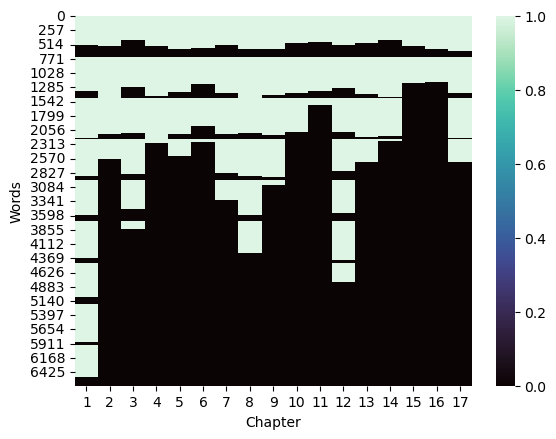

In [67]:
# Graphical preview of the dataframe chapters
sns_heatmap_chapters = sns.heatmap(chapters.notnull(),
                                          cmap="mako")
sns_heatmap_chapters.set(xlabel="Chapter", ylabel="Words")

In [74]:
# Plotly - 
px_heatmap_chapters = px.imshow(chapters.notnull(),
                         aspect="auto",
                         zmin=0,
                         zmax=1,
                         color_continuous_scale = px.colors.sequential.Teal,
                         labels = dict(x="Chapter", y="Words"))
px_heatmap_chapters.show()
px_heatmap_chapters.write_html("06_words_per_chapter_heatmap.html")

### *3.2.3. Dispersion and outliers*

In [91]:
# Get quantiles 1 and 3, as well as the maximum and minimum limits
q1 = get_quantile(chapters.notnull().sum(), 0.25)
q3 = get_quantile(chapters.notnull().sum(), 0.75)
median = chapters.notnull().sum().median()
iqr = q3-q1
min_lim = q1-(iqr*1.5)
max_lim = q3+(iqr*1.5)

chapters_with_outliers_data = [q1, q3, median, iqr, min_lim, max_lim]

print('q1: ', q1)
print('q3: ', q3)
print('median: ', median)
print('min lim: ', min_lim)
print('max lim: ', max_lim)

q1:  1702.5
q3:  2793.75
median:  2242.0
min lim:  65.625
max lim:  4430.625


[Text(0, 0.5, 'Words')]

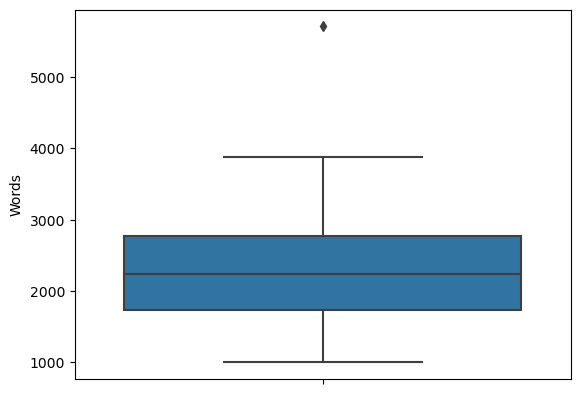

In [93]:
# Plot- boxplot
sns_boxplot_chapters = sns.boxplot(y=chapters.notnull().sum())
sns_boxplot_chapters.set(ylabel="Words")

In [92]:
# Graphical approach - Plotly
px_boxplot_chapters = px.box(y=chapters.notnull().sum(),
                          labels = dict(y="Words"),
                          color_discrete_sequence=px.colors.sequential.Tealgrn[::-1])
px_boxplot_chapters.show()
px_boxplot_chapters.write_html("07_words_per_chapter_boxplot.html")


In [94]:
# By this point we know that there is only one outlier
# So we try to proceed to remove the outlier

In [97]:
chapter_outliers = []
for chapter in chapters.columns.tolist():
    if (chapters[chapter].notnull().sum() > max_lim):
        chapter_outliers.append(chapter)
        
print("Chapters with outliers", chapter_outliers)

Chapters with outliers ['1']


In [105]:
# Extract outliers

In [101]:
# We use a new provisional dataframe excluding the outlier
chapters_without_outliers = chapters.iloc[:,1:]

In [102]:
# If we repeat the analysis

# Get quantiles 1 and 3, as well as the maximum and minimum limits
q1 = get_quantile(chapters_without_outliers.notnull().sum(), 0.25)
q3 = get_quantile(chapters_without_outliers.notnull().sum(), 0.75)
median = chapters_without_outliers.notnull().sum().median()
iqr = q3-q1
min_lim = q1-(iqr*1.5)
max_lim = q3+(iqr*1.5)

chapters_without_outliers_data = [q1, q3, median, iqr, min_lim, max_lim]

print('q1: ', q1)
print('q3: ', q3)
print('median: ', median)
print('min lim: ', min_lim)
print('max lim: ', max_lim)

q1:  1672.0
q3:  2735.0
median:  2200.5
min lim:  77.5
max lim:  4329.5


[Text(0, 0.5, 'Words')]

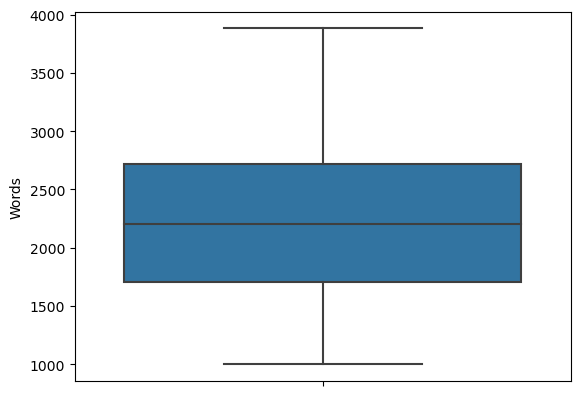

In [103]:

# Plot- boxplot
sns_boxplot_chapters = sns.boxplot(y=chapters_without_outliers.notnull().sum())
sns_boxplot_chapters.set(ylabel="Words")


In [104]:
# Graphical approach - Plotly
px_boxplot_chapters_no_ol = px.box(y=chapters_without_outliers.notnull().sum(),
                          labels = dict(y="Words"),
                          color_discrete_sequence=px.colors.sequential.Tealgrn[::-1])
px_boxplot_chapters_no_ol.show()
px_boxplot_chapters_no_ol.write_html("08_words_per_chapter_no_ol_boxplot.html")


In [106]:
# Visually it is noticeable that there is no outliers, which can be verified

chapter_outliers = []
for chapter in chapters_without_outliers.columns.tolist():
    if (chapters_without_outliers[chapter].notnull().sum() > max_lim):
        chapter_outliers.append(chapter)
        
print("Chapters with outliers", chapter_outliers)

Chapters with outliers []


In [107]:
# Just as in the previous section, the data used will be considering outliers since the data is limited


### *3.2.4. Count of words*

[Text(0.5, 0, 'Chapter'), Text(0, 0.5, 'Words')]

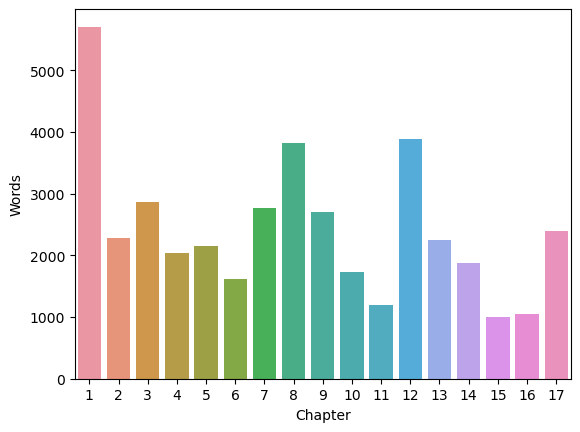

In [77]:
sns_bar_chapters = sns.barplot(y=chapters.notnull().sum().tolist(),
                               x=chapters.notnull().sum().index.tolist())
sns_bar_chapters.set(xlabel="Chapter", ylabel="Words")

In [90]:
px_bar_words_per_chap = px.bar(y=chapters.notnull().sum().tolist(),
                               x=chapters.notnull().sum().index.tolist(),
                               labels=dict(x="Chapter", y="Words"),
                               color_discrete_sequence=px.colors.sequential.Tealgrn[::-1])
px_bar_words_per_chap.show()
px_bar_words_per_chap.write_html("09_words_per_chapter_bar.html")


### *3.2.5. Descriptive statistics*

In [82]:
# Mean
print("On average, a chapter has", round(chapters.notnull().sum().mean()), "words")


On average, a chapter has 2432 words


In [86]:
# Chapter with minimum amount of words
print("The Chapter with least amount of words is the", chapters.notnull().sum().sort_values().index[0])
print("The number of words this chapter has is", chapters.notnull().sum().sort_values()[0])


The Chapter with least amount of words is the 15
The number of words this chapter has is 999


In [87]:
# Chapter with the most amount of words
print("The Chapter with most amount of words is the", chapters.notnull().sum().sort_values(ascending=False).index[0])
print("The number of words this chapter has is", chapters.notnull().sum().sort_values(ascending=False)[0])


The Chapter with most amount of words is the 1
The number of words this chapter has is 5709


### *3.2.6. Frequency of words*

In [111]:
# Create a new data frame including: 

#   the chapter number, 
#   the most used word in the chapter and 
#   the times the word is used


# Get these as lists
chapter_list = []
word_list = []
word_times_list = []
for col in chapters.columns.tolist():
    chapter_list.append(col)
    word_list.append(chapters[col].value_counts().index[0])
    word_times_list.append(chapters[col].value_counts()[0])

# Make a tuple of the lists
most_used_words_per_chap_tuple = list(zip(chapter_list, word_list, word_times_list))

# Create a dataframe from the tuple
most_used_words_per_chapter = pd.DataFrame(most_used_words_per_chap_tuple, columns=['Chapter', 'Word', 'Times'])



In [120]:
# Which was the most used word in the chapters?
print("The word '",most_used_words_per_chapter['Word'].value_counts().index[0], "' was the most used word in the majority of the chapters")
print("This word was the most used in",most_used_words_per_chapter['Word'].value_counts()[0], "out of", len(most_used_words_per_chapter), "chapters")


The word ' de ' was the most used word in the majority of the chapters
This word was the most used in 16 out of 17 chapters


### 3.3. Pages per chapter

### *3.3.1. Data preparation*

In [122]:
# Take a look at the index for this notation

In [123]:
# A dataframe is created to simplify

# Lists and values
list_chs = ['Chapter_1', 'Chapter_2', 'Chapter_3', 'Chapter_4', 'Chapter_5', 'Chapter_6', 'Chapter_7', 'Chapter_8', 'Chapter_9', 'Chapter_10', 'Chapter_11', 'Chapter_12', 'Chapter_13', 'Chapter_14', 'Chapter_15', 'Chapter_16', 'Chapter_17'] 
list_ini = [7, 16, 20, 26, 30, 34, 38, 43, 51, 56, 60, 63, 70, 74, 78, 80, 82] 
list_las = [15, 19, 25, 29, 33, 37, 42, 48, 55, 59, 62, 69, 73, 77, 79, 81, 85]

# Tuple
pages_per_chapter_tuple = list(zip(list_chs, list_ini, list_las))

# DataFrame
pages_per_chapter = pd.DataFrame(pages_per_chapter_tuple, columns=['Chapter', 'First_page', 'Last_page'])

In [125]:
# Add a new column to look at the number of pages
pages_per_chapter['Num_pages']=pages_per_chapter['Last_page']-pages_per_chapter['First_page']+1


### *3.3.2. Descriptive statistics*

In [157]:
# Mean
print("On average, a chapter has",round(pages_per_chapter['Num_pages'].mean()),"pages")


On average, a chapter has 5 pages


In [145]:
# What page has the most amount of pages?

# First, the max number of pages need to be obtained
print("The maximum number of pages in a chapter is",pages_per_chapter['Num_pages'].max())
# Then the chapter that has it
print("Which corresponds to the",pages_per_chapter[pages_per_chapter['Num_pages'] == pages_per_chapter['Num_pages'].max()]['Chapter'][0])


The maximum number of pages in a chapter is 9
Which corresponds to the Chapter_1


### *3.3.3. Count of pages*

[Text(0.5, 0, 'Pages'), Text(0, 0.5, 'Chapter')]

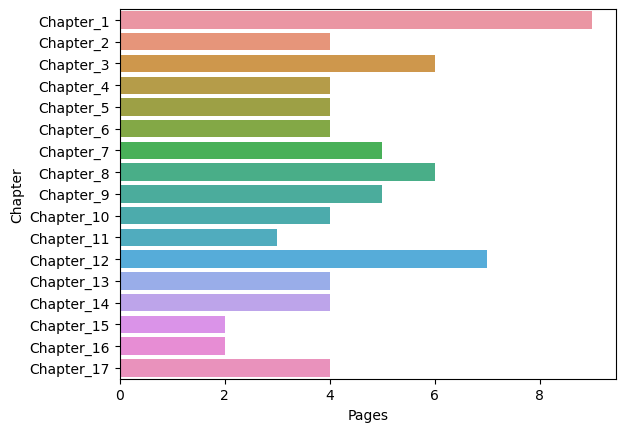

In [150]:
# Seaborn
sns_bar_pages_chapters = sns.barplot(x=pages_per_chapter['Num_pages'],
                               y=pages_per_chapter['Chapter'])
sns_bar_pages_chapters.set(xlabel="Pages", ylabel="Chapter")


In [154]:
# Plotly
px_bar_pages_per_chapter = px.bar(x=pages_per_chapter['Num_pages'],
                               y=pages_per_chapter['Chapter'],
                               labels=dict(x='Pages', y='Chapter'),
                               color_discrete_sequence=px.colors.sequential.Tealgrn[::-1])
px_bar_pages_per_chapter.show()
px_bar_pages_per_chapter.write_html("10_pages_per_chapter.html")

### *3.3.4. Proportion of chapters*

In [159]:
# It is expected that the chapter 1 occupies the majority

In [163]:
### Not seaborn is available :/

In [165]:
pages_per_chapter_pie = px.pie(values=pages_per_chapter['Num_pages'],
                               names=pages_per_chapter['Chapter'],
                               color_discrete_sequence=px.colors.sequential.haline)
pages_per_chapter_pie.show()
pages_per_chapter_pie.write_html("11_chapter_proportion_pie.html")

In [166]:
# By this plot we can verify that the chapter 1 occupies the 11.7% of total pages

### *3.3.5. Statistic analysis: Linear regression*

In [173]:
# make a list of the wordsnumber of words perchapter
num_words_list = chapters.notnull().sum().tolist()

In [182]:
# new temporary dataframe for the analysis

chapters_pages_words = pages_per_chapter
# add new column with the number of words
chapters_pages_words['Num_words']=num_words_list

In [183]:
chapters_pages_words

,Chapter,First_page,Last_page,Num_pages,Num_words
0,Chapter_1,7,15,9,5709
1,Chapter_2,16,19,4,2277
2,Chapter_3,20,25,6,2874
3,Chapter_4,26,29,4,2033
4,Chapter_5,30,33,4,2159
5,Chapter_6,34,37,4,1611
6,Chapter_7,38,42,5,2767
7,Chapter_8,43,48,6,3829
8,Chapter_9,51,55,5,2703
9,Chapter_10,56,59,4,1733


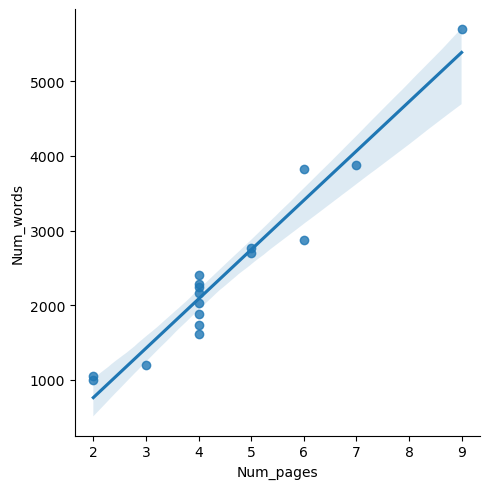

In [186]:
sns_scatter_words_pages = sns.lmplot(x='Num_pages',
                                          y='Num_words',
                                    data=chapters_pages_words)


In [197]:
px_scatter_pages_words_chap = px.scatter(chapters_pages_words,
                                         x='Num_pages',
                                         y='Num_words',
                                         trendline='ols'
                                        )
px_scatter_pages_words_chap.show()
px_scatter_pages_words_chap.write_html("12_words_vs_pages_reg.html")

In [425]:
# Linear regression
res = linregress(chapters_pages_words['Num_pages'], chapters_pages_words['Num_words'])


In [426]:
# equation = "round(res.intercept, 4), + x, round(res.slope, 4)"
equation = "y = {0} + {1} x".format(round(res.intercept, 4), round(res.slope, 4))


In [427]:
# Show equation
print("Through the linear regression, an equation can be obtained: \n\n",equation,"\n\nWhere:\ny = number of words \nx=number of pages")


Through the linear regression, an equation can be obtained: 

 y = -563.5463 + 661.3024 x 

Where:
y = number of words 
x=number of pages


In [428]:
# Representativeness
print("The R2 value show that the correlation is representative, R2 =",round(res.rvalue**2, 4))


The R2 value show that the correlation is representative, R2 = 0.9402


### 3.4. Pages per section

### *3.4.1 Data preparation*

In [239]:
pages_per_chapter

,Chapter,First_page,Last_page,Num_pages,Num_words
0,Chapter_1,7,15,9,5709
1,Chapter_2,16,19,4,2277
2,Chapter_3,20,25,6,2874
3,Chapter_4,26,29,4,2033
4,Chapter_5,30,33,4,2159
5,Chapter_6,34,37,4,1611
6,Chapter_7,38,42,5,2767
7,Chapter_8,43,48,6,3829
8,Chapter_9,51,55,5,2703
9,Chapter_10,56,59,4,1733


In [240]:
# The sections 1 contains from the first chapter (row 0) to the 8th (row 7)
pages_per_chapter.iloc[:8, :]

,Chapter,First_page,Last_page,Num_pages,Num_words
0,Chapter_1,7,15,9,5709
1,Chapter_2,16,19,4,2277
2,Chapter_3,20,25,6,2874
3,Chapter_4,26,29,4,2033
4,Chapter_5,30,33,4,2159
5,Chapter_6,34,37,4,1611
6,Chapter_7,38,42,5,2767
7,Chapter_8,43,48,6,3829


### *3.4.2. Proportion of sections*

In [243]:
# empty list
section_pages = []

# separate into lists
section_1_pages_words=[pages_per_chapter.iloc[:8, :]['Num_pages'].sum(),pages_per_chapter.iloc[:8, :]['Num_words'].sum()]
section_2_pages_words=[pages_per_chapter.iloc[8:, :]['Num_pages'].sum(),pages_per_chapter.iloc[8:, :]['Num_words'].sum()]

# nest lists
section_pages.append(section_1_pages_words)
section_pages.append(section_2_pages_words)

In [274]:
# create a mini dataframe temporal
section_pages_words = pd.DataFrame(section_pages)
section_pages_words

,0,1
0,42,23259
1,35,18081


In [275]:
section_pages_words.insert(loc=0, column='Section', value=['Section_1', 'Section_2'])

In [276]:
section_pages_words.rename(columns = {0:'Pages', 1:'Words'}, inplace=True)

In [277]:
section_pages_words

,Section,Pages,Words
0,Section_1,42,23259
1,Section_2,35,18081


In [278]:
section_pages_words['percentage_words'] = section_pages_words['Words']/section_pages_words['Words'].sum()
section_pages_words['percentage_pages'] = section_pages_words['Pages']/section_pages_words['Pages'].sum()

section_pages_words

,Section,Pages,Words,percentage_words,percentage_pages
0,Section_1,42,23259,0.562627,0.545455
1,Section_2,35,18081,0.437373,0.454545


With this table, it is noticeable that the first section is occupies more than the second.
Although is not that much, the difference is ~10%

### 3.5. Total words

### *3.5.1. Data preparation*

In [286]:
# In order to get the words per section, a previously defined funcion is used again
# the prologues of their respective setions are included

# empty list
extended_word_list = []
# separate the section 1 and then extend to the list
extended_word_list.extend(pages_separator('6', '48'))
# separate the section 1 and then extend to the list
extended_word_list.extend(pages_separator('50', '85'))


In [288]:
# Create a dataframe
total_words = pd.DataFrame(extended_word_list, columns=['Words'])

total_words

,Words
0,prólogo
1,las
2,ocho
3,piezas
4,de
...,...
58534,None
58535,None
58536,None
58537,None


In [296]:

print("Total number of words:",total_words['Words'].notnull().sum())
print("Total number of empty cells:",total_words['Words'].isnull().sum())

Total number of words: 42013
Total number of empty cells: 16526


In [302]:
total_words.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58539 entries, 0 to 58538
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Words   42013 non-null  object
dtypes: object(1)
memory usage: 457.5+ KB


In [297]:
# This can be visualized with a heatmap


[Text(50.722222222222214, 0.5, 'Words')]

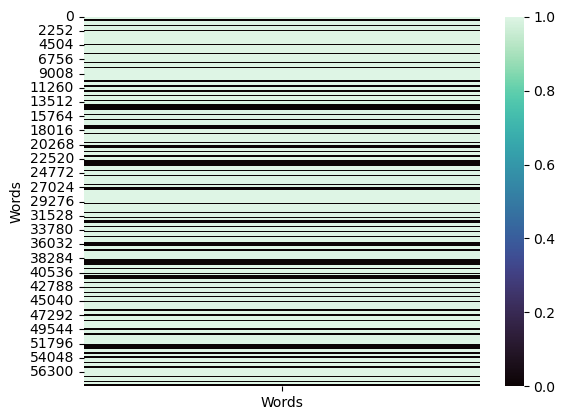

In [299]:
# Seaborn
sns_heatmap_total_words = sns.heatmap(total_words.notnull(),
            cmap="mako")
sns_heatmap_total_words.set(ylabel="Words")

In [301]:
# Plotly
px_heatmap_total_words = px.imshow(total_words.notnull(),
                         aspect="auto",
                         zmin=0,
                         zmax=1,
                         color_continuous_scale = px.colors.sequential.Teal,
                         labels = dict(y="Words"))
px_heatmap_total_words.show()
px_heatmap_total_words.write_html("13_total_words_heatmap.html")

In [303]:
# It is necessary to remove the null values (rows)

total_words = total_words.dropna(how='any', axis=0)

In [308]:
# Verifiy he number of 
print("Total number of words:",total_words['Words'].notnull().sum())
print("Total number of empty cells:",total_words['Words'].isnull().sum())

Total number of words: 42013
Total number of empty cells: 0


In [311]:
total_words.reset_index(drop=True).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42013 entries, 0 to 42012
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Words   42013 non-null  object
dtypes: object(1)
memory usage: 328.4+ KB


It is noticeable that after the extration of null values, momery usage changes.<br>
Before the removal de nulls it was 457.5+ KB and now is 328.4+ KB


### *3.5.2. Descriptive statistics*

In [313]:
print("Total number of words:", len(total_words))

Total number of words: 42013


In [314]:
# unique words
print("Total non repeated words:", len(total_words['Words'].unique()))


Total non repeated words: 9251


In [324]:
# The most used word
print("the most used word is '",total_words['Words'].value_counts().index[0],"'")
print("It is used",total_words['Words'].value_counts()[0], "times")

the most used word is ' de '
It is used 2540 times


### *3.5.3. Frequency of words*

[Text(0.5, 0, 'Count'), Text(0, 0.5, 'Word')]

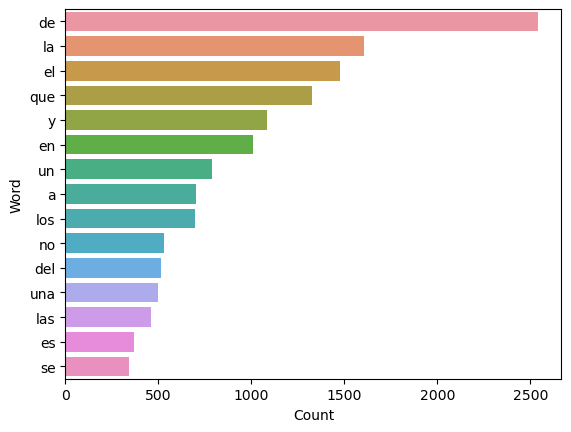

In [322]:
# Grraph the most used words 
# Seaborn
sns_bar_total_words = sns.countplot(data=total_words,
                                  y='Words',
                                  order=total_words['Words'].value_counts().index[0:15])
sns_bar_total_words.set(xlabel="Count", ylabel="Word")


In [329]:
# Plotly
px_bar_total_words = px.bar(x=total_words['Words'].value_counts()[0:15],
                               y=total_words['Words'].value_counts().index[0:15],
                               labels=dict(x='Count', y='Word'),
                               color_discrete_sequence=px.colors.sequential.Tealgrn[::-1])
px_bar_total_words.show()
px_bar_total_words.write_html("14_total_words_count.html")


In [340]:
# Total Number of words that are only used once, 1 time
word_once = total_words['Words'].value_counts()<=1

In [348]:
word_once

de              False
la              False
el              False
que             False
y               False
                ...  
laberínticas     True
investigar       True
entrega          True
dictámenes       True
sale             True
Name: Words, Length: 9251, dtype: bool

In [351]:
# Words useed once
print("The number of words used only once are",np.where(word_once, 1, 0).sum(),"out of",len(word_once))


The number of words used only once are 5798 out of 9251


In [358]:
# The most used 50 words
print("The list of the 50 most used words:",(total_words['Words'].value_counts().sort_values(ascending=False).index[0:50]).tolist())


The list of the 50 most used words: ['de', 'la', 'el', 'que', 'y', 'en', 'un', 'a', 'los', 'no', 'del', 'una', 'las', 'es', 'se', 'con', 'lo', 'su', 'por', 'o', 'era', 'me', 'le', 'al', 'había', 'pero', 'para', 'como', 'esa', 'ese', 'más', 'mi', 'hombre', 'yo', 'sus', 'dos', 'sin', 'ha', 'otro', 'son', 'ya', 'también', 'vez', 'he', 'todos', 'cada', 'hombres', 'uno', 'hay', 'casi']


## 4. Further analysis and processing

### 4.1. Case: Seek for words

### *4.1.1. Seach and locate a specific word*

In [361]:
total_words[total_words['Words']=='ficciones']

,Words
12954,ficciones
30498,ficciones
30751,ficciones


In [362]:
## With this, a total of three mentions of the title are found
# However, we don't know where are these located

In [365]:
# We will use the first dataframe - Words, since there a column represented a page
look_rows = words.where(words=='ficciones').dropna(how='all')


In [366]:
look_rows

,6,7,8,9,10,11,12,13,14,15,...,76,77,78,79,80,81,82,83,84,85
122,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
362,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
375,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [369]:
# The word is the 122th, 362th and 375th word of the page

In [367]:
# Now that we found the position in where the word is located, we will find hte pages

# For this, we need to traponse the dataframe words
words_t = words.T
look_columns = words_t.where(words_t=='ficciones').dropna(how='all')

In [368]:
look_columns

,5,6,7,8,9,10,11,12,13,14,...,736,737,738,739,740,741,742,743,744,745
23,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
47,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [370]:
# The pages containing the word are the 23 and the 47

In [371]:
# Now that we found the column and row, it is posible to try to find the word of these position:
print('At locations Row:122; Column:47 ', words.loc[122]['47'])
print('At locations Row:362; Column:47 ', words.loc[375]['47'])
print('At locations Row:362; Column:23 ', words.loc[362]['23'])

At locations Row:122; Column:47  ficciones
At locations Row:362; Column:47  ficciones
At locations Row:362; Column:23  ficciones


In [372]:
# The findings are accurate!

### *4.1.2. Get sentences for a specific word*

In [376]:
# Create a function to finded sentences - function 04?
def find_sentence(word, num_page):
    sentences=[]
    pdf_page = pdf.pages[num_page].extract_text()
    regex_sentences = re.findall(r'[^.]+', pdf_page)
    for re_sentence in regex_sentences:
        sentences.append(re_sentence)
    found_sentences = []
    for sent in range(len(sentences)):
        if word in sentences[sent]:
            found_sentences.append(sentences[sent].replace('\n', ''))
    return found_sentences

In [377]:
# Use function to find the word in the page 23
# Since this function uses the pdf file, it begin at index 0
# page 23 would be 22

ficciones_pg23 = find_sentence('ficciones', 22)


In [378]:
print(ficciones_pg23)

[' Éste, de un modo burdo, opone a las ficciones caballerescas la pobre realidad provinciana de su país; Menard elige como «realidad» la tierra de Carmen durante el siglo de Lepanto y de Lope']


In [379]:
# Repeat with the page 47

ficciones_pg47 = find_sentence('ficciones', 46)
print(ficciones_pg47)

[" En todas las ficciones, cada vez que un hombre se enfrenta con diversas alternativas, opta por una y elimina las otras; en la del casi inextricable Ts'ui Pên, opta -simultáneamente- por todas", ' Yo oía con decente veneración esas viejas ficciones, acaso menos admirables que el hecho de que las hubiera ideado mi sangre y de que un hombre de un imperio remoto me las restituyera, en el curso de una desesperada aventura, en una isla occidental']


In [402]:
# This functions allows to find any other word in a specific page

# first generate a random number 
rand_num = np.random.randint(85)
print("At page number:",rand_num)

# then search a specific word 
# it is recommended to use some of the most used words
search_res = find_sentence('del', rand_num)
print(search_res)

At page number: 43
[' Encontré lo que sabía que iba a encont rar: el reloj norteamericano, la cadena de níquel y la moneda cuadrangular, el llavero con las comprometedoras llaves inútiles del departamento de Runeberg, la libreta, una carta que resolví destruir inmediatamente (y que no destruí), una corona, dos chelines y unos Pêniques, el lápiz rojo-azul, el pañuelo, el revólver con una bala', ' Además, yo debía huir del capitán', ' Un hombre que reconocí corrió en vano hasta el límite del andén', ' Aniquilado, trémulo, me encogí en la otra punta del sillón, lejos del temido cristal', ' Me dije que ya estaba empeñado mi duelo y que yo había ganado el primer asalto, al burlar, siquiera por cuarenta minutos, siquiera por un favor del azar, el ataque de mi adversario', ' Se detuvo, casi en medio del campo', ' casa del ']


### 4.2. Case: Compare multiple data against API requests

### *4.2.1. Search if the 500 words most used are in the RAE*

In [403]:
# Create a list of the most used words
most_used_words_500 = total_words['Words'].value_counts().sort_values(ascending=False).index[0:500]


In [404]:
len(most_used_words_500)

500

In [405]:
# List for detect true/false
most_used_words_bool = []
# List for words not found in the RAE
most_used_words_no_rae = []

# loop
# ! This function work via request! it is expected to take more time than any other process
for word in most_used_words_500:
    re_word = dle.search_by_word(word=word)
    if(len(re_word.to_dict().keys())>1):
        most_used_words_bool.append(1)
    else:
        most_used_words_bool.append(0)
        most_used_words_no_rae.append(word)


2023-08-06 18:39:44,620 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/de'...
2023-08-06 18:39:45,285 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/la'...
2023-08-06 18:39:45,681 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/el'...
2023-08-06 18:39:46,230 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/que'...
2023-08-06 18:39:47,147 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/y'...
2023-08-06 18:39:47,615 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/en'...
2023-08-06 18:39:48,057 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/un'...
2023-08-06 18:39:48,439 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/a'...
2023-08-06 18:39:48,985 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/los'...
2023-08-06 18:39:49,726 - INFO    - dle.search

2023-08-06 18:40:29,080 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/esos'...
2023-08-06 18:40:29,835 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/despu%C3%A9s'...
2023-08-06 18:40:30,269 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/estaba'...
2023-08-06 18:40:31,355 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/libros'...
2023-08-06 18:40:32,449 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/dahlmann'...
2023-08-06 18:40:33,460 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/obra'...
2023-08-06 18:40:34,020 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/han'...
2023-08-06 18:40:34,966 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/menos'...
2023-08-06 18:40:35,545 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/ser'...
2023-08-06 18

2023-08-06 18:41:20,665 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/nada'...
2023-08-06 18:41:21,195 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/cosas'...
2023-08-06 18:41:21,577 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/bien'...
2023-08-06 18:41:22,330 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/hubiera'...
2023-08-06 18:41:23,270 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/tarde'...
2023-08-06 18:41:23,700 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/contra'...
2023-08-06 18:41:24,477 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/azar'...
2023-08-06 18:41:24,892 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/universo'...
2023-08-06 18:41:25,285 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/tierra'...
2023-08-06 18:4

2023-08-06 18:42:10,995 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/2'...
2023-08-06 18:42:11,368 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/esperanza'...
2023-08-06 18:42:11,775 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/mano'...
2023-08-06 18:42:13,610 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/ts'...
2023-08-06 18:42:14,005 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/ten%C3%ADa'...
2023-08-06 18:42:14,975 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/pudo'...
2023-08-06 18:42:15,978 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/principio'...
2023-08-06 18:42:16,480 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/ui'...
2023-08-06 18:42:16,880 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/treviranus'...
2023-08-06 18

2023-08-06 18:43:00,520 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/agua'...
2023-08-06 18:43:02,005 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/hab%C3%ADan'...
2023-08-06 18:43:02,957 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/n'...
2023-08-06 18:43:03,357 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/scharlach'...
2023-08-06 18:43:04,469 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/f%C3%A9nix'...
2023-08-06 18:43:04,890 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/quer%C3%ADa'...
2023-08-06 18:43:05,850 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/ciudad'...
2023-08-06 18:43:06,345 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/hex%C3%A1gono'...
2023-08-06 18:43:06,775 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/diez

2023-08-06 18:43:49,660 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/patio'...
2023-08-06 18:43:50,086 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/especie'...
2023-08-06 18:43:50,545 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/templo'...
2023-08-06 18:43:50,947 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/pierre'...
2023-08-06 18:43:51,900 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/sue%C3%B1os'...
2023-08-06 18:43:52,715 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/iba'...
2023-08-06 18:43:53,956 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/l'...
2023-08-06 18:43:54,361 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/bifurcan'...
2023-08-06 18:43:55,120 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/senderos'...
2023-08-0

2023-08-06 18:44:37,570 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/sentencia'...
2023-08-06 18:44:37,989 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/natural'...
2023-08-06 18:44:38,477 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/treinta'...
2023-08-06 18:44:38,909 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/espa%C3%B1ol'...
2023-08-06 18:44:39,315 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/conjetura'...
2023-08-06 18:44:39,725 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/ser%C3%ADa'...
2023-08-06 18:44:40,728 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/cierto'...
2023-08-06 18:44:41,176 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/cuarenta'...
2023-08-06 18:44:41,615 - INFO    - dle.search_by_url - Performing request to: 'https://dle.rae.es/l

In [406]:
print(most_used_words_bool)
print(most_used_words_no_rae)

[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

In [408]:
# dataframe of most_used_words 500
most_used_words_bool = pd.DataFrame(most_used_words_bool, columns=['RAE'])
most_used_words_bool['RAE'].value_counts()

1    440
0     60
Name: RAE, dtype: int64

In [409]:
# Plotly 
px_pie_most_used_words_bool = px.pie(values=most_used_words_bool['RAE'].value_counts(),
                                     names=['Found', 'Not Found'],
                                     color_discrete_sequence=px.colors.sequential.Teal,
                                    hole=0.8)
px_pie_most_used_words_bool.show()
px_pie_most_used_words_bool.write_html("15_500_words_in_rae_donut.html")

In [410]:
# These 12% corresponds to:
print(most_used_words_no_rae)

['es', 'fue', 'años', 'dahlmann', 'eran', 'tlön', 'unos', '1', 'lönnrot', 'menard', 'veces', 'the', 'sé', 'hladík', 'runeberg', 'cosas', 'unas', 'funes', 'sólo', 'mis', 'almotásim', 'moon', 'manos', 'kilpatrick', '2', 'ts', 'ui', 'treviranus', 'uqbar', 'ireneo', 'hechos', '3', 'pên', 'albert', 'quain', 'fueron', 'scharlach', 'of', 'madden', 'nombres', 'yarmolinsky', 'herbert', 'pierre', 'nolan', 'roemerstadt', 'creo', 'obras', 'cervantes', 'aires', 'aguas', 'soldados', 'bahadur', 'formas', 'azevedo', 'vi', 'shakespeare', 'bioy', 'caras', 'and', 'nîmes']


In this we can see that there are some words that are actually spanish:
- This error is found in the plural form of some words like: años, cosas, veces
- Other kind of error in the RAE is before verb conjugated, like: es, fue, eran
- Another form in which the RAE doesn't match is with number: 1, 2, 3

<br>On the other hand, there were words that certainly are inexisting in spanish like names or places from other locations
- Entre nombre se encuentran Shakespear, Cervantes, Pierre, Nolan
- There are typical english words like: the, moon, of, and 

### 4.3. Case: Applications of probability and statistics

### *4.3.1. Estimation of chapters length*

In [429]:
# Previously a linear regression was found for the qunatity of words per amount of pages
print(equation)

y = -563.5463 + 661.3024 x


In [430]:
# If we use this equation, we could project how could be the a chapter even longer than the one presented here
# equation = "y = {0} + {1} x".format(round(res.intercept, 4), round(res.slope, 4))

def estimate_num_words(num_pages):
    num_words = res.intercept + (num_pages*res.slope)
    return round(num_words)


In [434]:
# Some cases
print("A chapter with 12 pages would have",estimate_num_words(12),"words")
print("A chapter with 6 pages would have",estimate_num_words(6),"words")
print("A chapter with 1 pages would have",estimate_num_words(1),"words")


A chapter with 12 pages would have 7372 words
A chapter with 6 pages would have 3404 words
A chapter with 1 pages would have 98 words


### *4.3.2. Poisson distribution of probability of chapters length*

In [ ]:
# previously it was stablished that the longer chapter was the first with 9 pages
# what is the probability of these to happen
# we need to consider that on average a chapter has 5 pages

In [441]:
# The mu is the events per interval - in this case the mean value of pages per chapter
mu = round(pages_per_chapter['Num_pages'].mean())

# Poisson distribution for the specified mu
dist = poisson(mu)

# Probability of an ocurrence of 9 pages (k)
k = 9

# Result
print(dist.pmf(k))

0.036265577415643714


In [447]:
# The maximum and minimum pages in a chapter
min_pages = pages_per_chapter['Num_pages'].min()
max_pages = pages_per_chapter['Num_pages'].max()

[Text(0.5, 0, 'Pages'), Text(0, 0.5, 'Probability')]

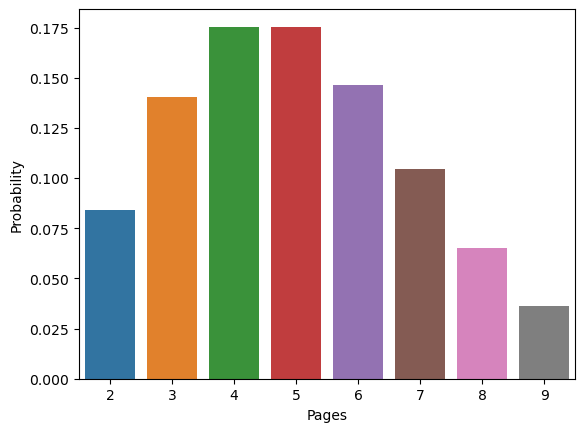

In [451]:
sns_bar_poisson = sns.barplot(x=np.arange(min_pages, max_pages+1),
                              y=dist.pmf(np.arange(min_pages, max_pages+1)))
sns_bar_poisson.set(xlabel="Pages", ylabel="Probability")

In [453]:
px_bars_poisson = px.bar(x=np.arange(min_pages, max_pages+1),
                         y=dist.pmf(np.arange(min_pages, max_pages+1)), 
                         labels=dict(x="Pages", y="Probability"),
                        color_discrete_sequence=px.colors.sequential.Tealgrn[::-1])
px_bars_poisson.show()
px_bars_poisson.write_html("16_poisson_distribution.html")

### 4.4. Case: Wordcloud plot

In [455]:
# An extra feature for this study was to get an graphical piece of the text
# A Wordcloud from the text

In [456]:
# A long string is generated from the total_words dataFrame
words_for_cloud = total_words['Words'].str.cat(sep=' ')

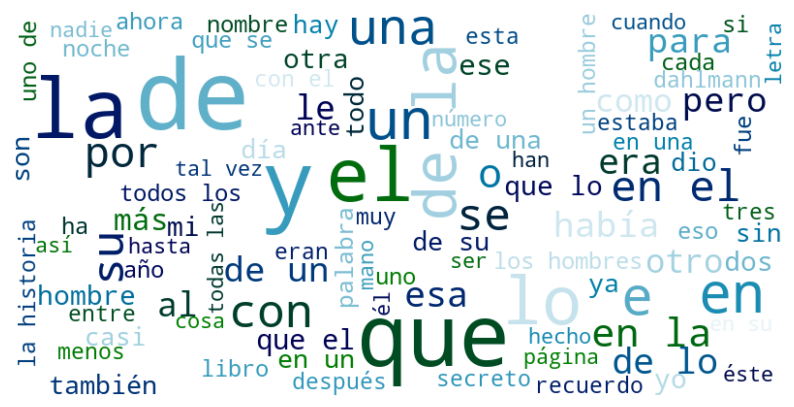

In [458]:
# Using plt
plt.rcParams['figure.figsize']=(10, 10)

# Config the wordcloud
plt_wordcloud = WordCloud(width=800, 
                          height=400,
                          max_font_size=100,
                          max_words=100,
                          background_color='rgba(255, 255, 255, 0)',
                          colormap='ocean').generate(words_for_cloud)

# Plot the cloud
plt.plot()
plt.imshow(plt_wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()



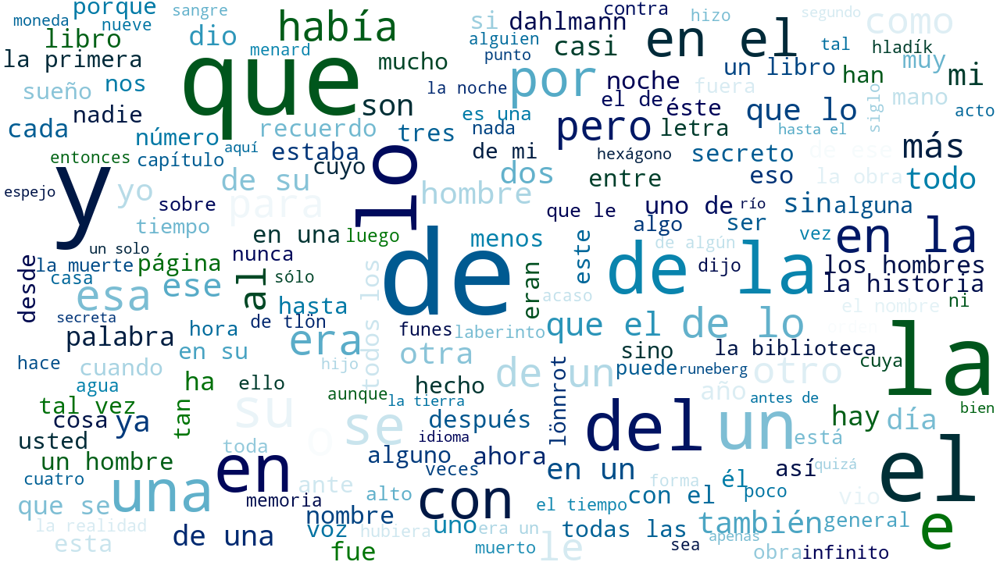

In [463]:
# Wordcloud using Plotly

# Config Wordcloud
wordcloud_for_px = WordCloud(width=1280, 
                      height=720,
                      max_font_size=150, 
                      max_words=200, 
                      background_color='rgba(255, 255, 255, 0)', 
                      colormap='ocean').generate(words_for_cloud)
# Plotly
px_wordcloud = px.imshow(wordcloud_for_px)
px_wordcloud.update_layout(coloraxis_showscale=False)
px_wordcloud.update_xaxes(showticklabels=False)
px_wordcloud.update_yaxes(showticklabels=False)
px_wordcloud.show()
px_wordcloud.write_html("17_wordcloud.html")
